[<img src="https://github.com/lourencocavalcante/LogosINPE/blob/main/logoinpe.png?raw=true" width = 500 align="left">](https://www.gov.br/inpe/pt-br)

[<img src="https://github.com/lourencocavalcante/LogosINPE/blob/main/LogoCAP.png?raw=true" width = 300 align="right">](http://www.inpe.br/posgraduacao/cap/)

<div style="text-align: center;font-size: 90%;">
<h2><strong>CAP-419 Introdução à Programação com Dados Geoespaciais</strong></h2>
<h3><strong>Datasets de imagens com diferentes resoluções espaciais</strong></h3>

</div>


<div style="text-align: center;font-size: 90%;">
<strong>Docentes:</strong><br>Prof. Dr. Gilberto Ribeiro de Queiroz e Prof. Dr. Thales Sehn Körti
<br><br>
</div>  


<div style="text-align: center;font-size: 90%;">
    <strong>Discentes:</strong><br>
    <strong>Lourenço José Cavalcante Neto</strong><sup><a href="https://orcid.org/0000-0001-6181-2158"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>
    <br/>
    Programa de Pós-graduação em Computação Aplicada, Instituto Nacional de Pesquisas Espaciais (INPE)
    <br/>
    Avenida dos Astronautas, 1758, Jardim da Granja, São José dos Campos, SP 12227-010, Brazil
    <br/>
    E-mail: <a href="mailto:lourenco.cavalante@ifto.edu.br">lourenco.cavalante@ifto.edu.br</a>
    <br/><br/>
    <strong>Gisele Machado Mota</strong><sup><a href="#"><i class="fab fa-lg fa-orcid" style="color: #a6ce39"></i></a></sup>
    <br/>
    Programa de Pós-graduação em Computação Aplicada, Instituto Nacional de Pesquisas Espaciais (INPE)
    <br/>
    Avenida dos Astronautas, 1758, Jardim da Granja, São José dos Campos, SP 12227-010, Brazil
    <br/>
    E-mail: <a href="mailto:giselemmota@gmail.com">giselemmota@gmail.com</a>
    <br/><br/>
</div>


<div style="text-align: justify;  margin-left: 10%; margin-right: 10%;">
<strong>Resumo: </strong> Este Jupyter Notebook é parte do projeto final da disciplina de Introdução à Programação com Dados Geoespaciais, em que se buscou aplicar, na prática, os conhecimentos adquiridos ao longo do curso. O trabalho teve como principal objetivo explorar a aquisição simultânea de imagens por diferentes sensores a bordo do satélite CBERS-4A (WFI, MUX e WPM), que observam as mesmas regiões com resoluções espaciais diferentes. Utilizando imagens disponibilizadas pelo Brazil Data Cube no formato COG (Cloud Optimized GeoTIFF), acessadas utilizando a SpatioTemporal Asset Catalog (STAC), foram selecionadas um conjunto de cenas em que todos os sensores adquiriram imagens da mesma data e área. A partir dessas imagens, foram gerados recortes geograficamente alinhados (patches), contendo quatro bandas por sensor. Esses patches foram organizados em um banco de dados multirresolução, apto para treinamento e avaliação de modelos de classificação baseados em Deep Learning. Além disso, o projeto envolveu a visualização e análise gráfica das diferenças e semelhanças entre os dados de diferentes resoluções.<br><br>
</div>

<div style="text-align: justify;  margin-left: 10%; margin-right: 10%;">

Este documento também está disponível no repositório da disciplina no GitHub, acessível por meio do link: <a href='https://github.com/lourencocavalcante/CAP-419-Programacao-com-Dados-Geoespaciais/blob/4c3be2102325c14cf20da425b687fa735b476287/ProjFinal_CAP419_ProgGeo2025_Lourenco_e_Gisele.ipynb' target='_blank'> https://github.com/lourencocavalcante/CAP-419-Programacao-com-Dados-Geoespaciais/blob/4c3be2102325c14cf20da425b687fa735b476287/ProjFinal_CAP419_ProgGeo2025_Lourenco_e_Gisele.ipynb</a>

</div>



---



# Importação das principais bibliotecas e dependências


In [101]:
import os
import numpy as np
import rasterio
from osgeo import gdal

from rasterio.enums import Resampling
from rasterio.warp import transform_bounds
from rasterio.windows import from_bounds
from rasterio.windows import Window
from PIL import Image
import geopandas as gpd
import shapely
from shapely.geometry import box
from shapely.geometry import mapping
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import matplotlib.patches as patches
import rioxarray as rxr
from collections import defaultdict
from datetime import datetime
import itertools

import folium


plt.rcParams['font.family'] = 'serif' #Usar nas figuras a mesma do texto no Overleaf em formato de artigo GEOINFO.

print("Execução concluída.")

Execução concluída.


Caso ocorra algum erro na execução das importações acima, descomente e execute a célula abaixo para instalar as dependências necessárias, e depois execute novamente a célula anterior.

In [3]:
#!pip install pystac-client rasterio shapely matplotlib rioxarray geopandas ipyleaflet folium

# Aquisição dos dados

Vamos usar o serviço STAC (SpatioTemporal Asset Catalog)  do Brazil Data Cube para descobrir e acessar os dados do CBERS-A4, nos quais serão usados nas próximas etapas do Projeto. O **STAC** é uma especificação criada por meio da colaboração de diversas organizações com o objetivo de aumentar a interoperabilidade da pesquisa de imagens de satélite.

In [4]:
#Para acessar as funcionalidades da API do cliente, precisamos importar o pacote pystac_client
import pystac_client

print(f'Versão do STAC: {pystac_client.__version__}\n')

#Aqui criamos um objeto STAC anexado ao serviço STAC do Brazil Data Cube, que chamaremos de "catalogo".
catalogo = pystac_client.Client.open("https://data.inpe.br/bdc/stac/v1/")

# Vamos listar apenas as 3 primeiras coleções disponíveis no catálogo.
count = 1
for colecao in catalogo.get_collections():

    print(f"Coleção {count}: {colecao.id}: {colecao.title}")
    count += 1
    if count <= 3:
        continue
    else:
        break

Versão do STAC: 0.8.5

Coleção 1: CB4-WFI-L2-DN-1: CBERS-4/WFI - Level-2-DN
Coleção 2: GOES19-L2-CMI-1: GOES-19 Cloud & Moisture Imagery
Coleção 3: EtaCCDay_CMIP5-1: Eta Model - Climate Change - CMIP5 - Day


Não listamos todas as coleções e cubos de dados disponíveis. Nosso foco está direcionado para o **satélite CBERS-4A**, especificamente nos **sensores WPM, MUX e WFI**, que foram os elencados para este trabalho. O sensor **WPM (Wide Scan Panchromatic and Multispectral Camera)** realiza o imageamento da superfície terrestre com **resolução espacial de 8 metros**, possui **revisita de 31 dias** e produz imagens de 10 bits. O sensor **MUX (Regular Multispectral Camera)** possui **resolução espacial de 16 metros**, também com **revisita de 31 dias**, e gera imagens de 8 bits. Já o sensor **WFI (Wide Field Imaging Camera)** cobre uma área maior, com resolução espacial de 55 mestros **negrito**, e **revisita de 5 dias** e produz imagens de 10 bits.
No código abaixo iremos verificamos se essa coleção é do satélite CBERS-4A
e se ela corresponde a um dos três sensores alvo.

In [5]:
# Vamos percorrer todas as coleções disponíveis no catálogo usando um "for"
for colecao in catalogo.get_collections():

    # Pegamos o título da coleção atual para facilitar o filtro
    titulo = colecao.title

    # Verificamos se essa coleção é do satélite CBERS-4A
    # e se ela corresponde a um dos três sensores de interesse: WFI, MUX ou WPM
    if "CBERS-4A" in titulo and ("WFI" in titulo or "MUX" in titulo or "WPM" in titulo):

        # Se a condição for atendida (verdadeira), mostramos o ID e o título da coleção
        print(f"{colecao.id}: {titulo}")


mosaic-cbers4a-paraiba-3m-1: CBERS-4A/WFI Image Mosaic of Brazil Paraíba State - 3 Months
CB4A-WFI-L2-DN-1: CBERS-4A/WFI - Level-2-DN
CB4A-WFI-L4-DN-1: CBERS-4A/WFI - Level-4-DN
CB4A-MUX-L2-DN-1: CBERS-4A/MUX - Level-2-DN
CB4A-WPM-L2-DN-1: CBERS-4A/WPM - Level-2-DN
CB4A-MUX-L4-DN-1: CBERS-4A/MUX - Level-4-DN
CB4A-WPM-L4-DN-1: CBERS-4A/WPM - Level-4-DN
CB4A-WFI-L4-SR-1: CBERS-4A/WFI - Level-4-SR - Cloud Optimized GeoTIFF
CB4A-WPM-PCA-FUSED-1: CBERS-4A/WPM - Multispectral and Panchromatic Bands Fusioned


Utilizamos o método collection para acessar informações referente às coleções **CB4A-WFI-L4-DN-1**, **CB4A-MUX-L4-DN-1** e **CB4A-WPM-L4-DN-1**. Assim como fizemos no código abaixo, em que acessamos as informações da coleção **CB4A-WFI-L4-DN-1**, o mesmo procedimento pode ser utilizado para as demais coleções. Optamos por usar do Level 4, pois elas são as mais procuradas e estão prontas para uso, sem necessidade de procedimentos adicionais por parte dos usuários.

In [6]:
# Com base nas visualizações acima, vamos definir as coleções do CBERS-4A  que temos interesse
colecoes_alvo = ['CB4A-WFI-L4-DN-1','CB4A-MUX-L4-DN-1','CB4A-WPM-L4-DN-1']

# Utilizamos o método collection para acessar informações referente às coleções
# CB4A-WFI-L4-DN-1, CB4A-MUX-L4-DN-1 e CB4A-WPM-L4-DN-1. Assim como fizemos no código abaixo,
# em que acessamos as informações da coleção CB4A-WFI-L4-DN-1, o mesmo procedimento pode ser utilizado para as demais coleções.


for id_collection in colecoes_alvo:
    collection = catalogo.get_collection(id_collection)

    print(f"\n{'='*40}")
    print(f"ID: {collection.id}")
    print(f"Título: {collection.title}")
    print(f"Descrição: {collection.description}")




ID: CB4A-WFI-L4-DN-1
Título: CBERS-4A/WFI - Level-4-DN
Descrição: CBERS-4A/WFI Level-4 Digital Number product. L4 product provides orthorectified images.

ID: CB4A-MUX-L4-DN-1
Título: CBERS-4A/MUX - Level-4-DN
Descrição: CBERS-4A/MUX - Level-4 Digital Number product. L4 product provides orthorectified images.

ID: CB4A-WPM-L4-DN-1
Título: CBERS-4A/WPM - Level-4-DN
Descrição: CBERS-4A/WPM - Level-4 Digital Number product. L4 product provides orthorectified images.


Agora vamos **definir o polígono da região de interesse** para consulta por coleções disponíveis na região escolhid, e criar/exibir um mapa interativo com destaque para a região de interesse usando o FOLIUM.

In [7]:
regiao_interesse =  shapely.geometry.shape({
    "type": "Polygon",
    "coordinates": [[ 

        # Retângulo de área maior na terra do meio
        [-56.29, -3.51],
        [-51.58, -3.51],
        [-51.58, -9.8],
        [-56.29, -9.8]
    ]]
})

# Conversão da geometria (região de interesse) para o formato GeoJSON
geojson_data = mapping(regiao_interesse)

# mapa centralizado no centro da geometria
centro = [regiao_interesse.centroid.y, regiao_interesse.centroid.x]

mapa = folium.Map(
    location=centro,
    zoom_start=4,
    control_scale=True,
    width='50%',
    height='300px'
)

# Camada GeoJSON ao mapa com o estilo
folium.GeoJson(
    geojson_data,
    name="Região de interesse",
    style_function=lambda x: {
        'color': 'SteelBlue',
        'weight': 3,
        'fillOpacity': 0.1
    },
    highlight_function=lambda x: {
        'color': 'IndianRed',
        'weight': 5,
        'fillOpacity': 0.1
    }
).add_to(mapa)

# Controles de camadas
folium.LayerControl().add_to(mapa)

# Exibiçao do map com o retângulo na região escolhida
mapa




## Agora vamos realiazr a consulta e filtragem de coleção por data, e seleção de cenas com sobreposição temporal (WFI, MUX, WPM)


In [8]:
# Busca e extração das datas em comum

resultados = {}
datas_por_colecao = defaultdict(list)

for colecao in colecoes_alvo:
    item_search = catalogo.search(
        collections=[colecao],
        datetime='2019-01-01/2025-05-05',
        intersects=shapely.geometry.mapping(regiao_interesse),
        # query={
        #     "eo:cloud_cover": {
        #         "lt": 5
        #     }
        # }
    )

    itens = list(item_search.items())
    resultados[colecao] = itens

    print(f"--> {len(itens)} cenas encontradas para {colecao}")

    for item in itens:

        data = item.properties['datetime'][:10]
        datas_por_colecao[colecao].append((data, item.id))

datas_em_comum = set.intersection(*[set([d for d, _ in datas]) for datas in datas_por_colecao.values()])

print("\nItens com datas em comum entre as coleções:\n")
for data in sorted(datas_em_comum):
    print(f"\n{data}:")
    for colecao in colecoes_alvo:
        itens = [item_id for d, item_id in datas_por_colecao[colecao] if d == data]

        for item_id in itens:
            print(f"  - {colecao}: {item_id}")


--> 14 cenas encontradas para CB4A-WFI-L4-DN-1
--> 18 cenas encontradas para CB4A-MUX-L4-DN-1
--> 14 cenas encontradas para CB4A-WPM-L4-DN-1

Itens com datas em comum entre as coleções:


2024-11-07:
  - CB4A-WFI-L4-DN-1: CBERS_4A_WFI_RAW_20241107_213_116_L4
  - CB4A-MUX-L4-DN-1: CBERS_4A_MUX_RAW_20241107_213_122_L4
  - CB4A-MUX-L4-DN-1: CBERS_4A_MUX_RAW_20241107_213_123_L4
  - CB4A-WPM-L4-DN-1: CBERS_4A_WPM_RAW_20241107_213_122_L4

2024-11-08:
  - CB4A-WFI-L4-DN-1: CBERS_4A_WFI_RAW_20241108_219_124_L4
  - CB4A-MUX-L4-DN-1: CBERS_4A_MUX_RAW_20241108_219_125_L4
  - CB4A-WPM-L4-DN-1: CBERS_4A_WPM_RAW_20241108_219_125_L4

2024-11-18:
  - CB4A-WFI-L4-DN-1: CBERS_4A_WFI_RAW_20241118_217_116_L4
  - CB4A-WFI-L4-DN-1: CBERS_4A_WFI_RAW_20241118_217_124_L4
  - CB4A-MUX-L4-DN-1: CBERS_4A_MUX_RAW_20241118_217_119_L4
  - CB4A-MUX-L4-DN-1: CBERS_4A_MUX_RAW_20241118_217_121_L4
  - CB4A-MUX-L4-DN-1: CBERS_4A_MUX_RAW_20241118_217_120_L4
  - CB4A-WPM-L4-DN-1: CBERS_4A_WPM_RAW_20241118_217_120_L4
  - CB4

## Visualização do NOME DAS BANDAS disponíveis para (WFI, MUX, WPM), com base nas coleções alvo


In [9]:
bandas_disponiveis_por_colecao = {}

for colecao in colecoes_alvo:
    busca_bandas = catalogo.search(
        collections=[colecao],
        datetime='2019-01-01/2025-05-05',
        intersects=shapely.geometry.mapping(regiao_interesse),
    )

    bandas_disponiveis_por_colecao[colecao] = list(busca_bandas.items())

    # Verificação do número de itens encontrados
    print(f"--> Bandas disponíveis para {colecao}:")

    # Vamos limitar a exibição da lista de bandas apenas para o primeiro registro de cada sensor, usando o parâmetro 1 em islice
    for item in itertools.islice(busca_bandas.items(), 1):
        # print(f"{item.id}")
        # print(f"{item.properties['datetime']}")
        for nome_banda in item.assets.keys():
            print(f"    - {nome_banda}")




--> Bandas disponíveis para CB4A-WFI-L4-DN-1:
    - BAND13
    - BAND14
    - BAND15
    - BAND16
    - thumbnail
    - BAND13_xml
    - BAND14_xml
    - BAND15_xml
    - BAND16_xml
--> Bandas disponíveis para CB4A-MUX-L4-DN-1:
    - BAND5
    - BAND6
    - BAND7
    - BAND8
    - BAND5_xml
    - BAND6_xml
    - BAND7_xml
    - BAND8_xml
    - thumbnail
--> Bandas disponíveis para CB4A-WPM-L4-DN-1:
    - BAND0
    - BAND1
    - BAND2
    - BAND3
    - BAND4
    - BAND0_xml
    - BAND1_xml
    - BAND2_xml
    - BAND3_xml
    - BAND4_xml
    - thumbnail


Após obtermos a lista de cenas e bandas disponíveis para cada sensor, nesta etapa faremos a seleção manual das cenas com sobreposição temporal e espacial entre os sensores WFI, MUX e WPM. Também será gerado um gráfico com o contorno das cenas, permitindo visualizar a posição geográfica de cada imagem por sensor, o que ajudou na obtenção de insights sobre a cobertura e alinhamento espacial.

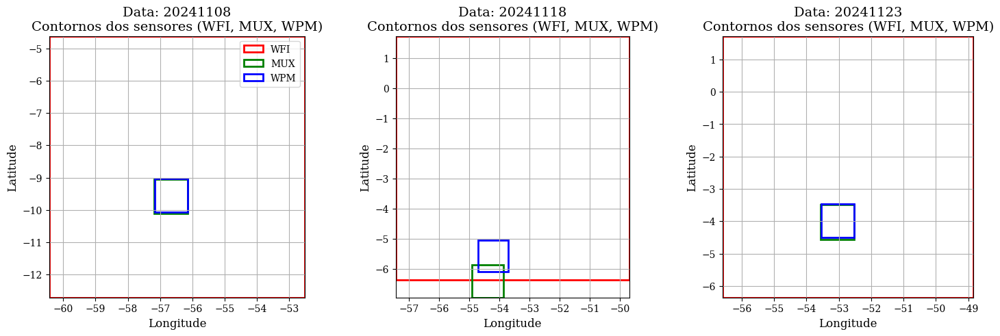

In [102]:
# Cenas organizadas por data e sensores
# 2024-11-23:
#   - CB4A-WFI-L4-DN-1: CBERS_4A_WFI_RAW_20241123_216_116_L4
#   - CB4A-WFI-L4-DN-1: CBERS_4A_WFI_RAW_20241123_216_124_L4

#   - CB4A-MUX-L4-DN-1: CBERS_4A_MUX_RAW_20241123_216_118_L4
#   - CB4A-MUX-L4-DN-1: CBERS_4A_MUX_RAW_20241123_216_119_L4
#   - CB4A-MUX-L4-DN-1: CBERS_4A_MUX_RAW_20241123_216_121_L4
#   - CB4A-MUX-L4-DN-1: CBERS_4A_MUX_RAW_20241123_216_122_L4

#   - CB4A-WPM-L4-DN-1: CBERS_4A_WPM_RAW_20241123_216_118_L4
#   - CB4A-WPM-L4-DN-1: CBERS_4A_WPM_RAW_20241123_216_119_L4
#   - CB4A-WPM-L4-DN-1: CBERS_4A_WPM_RAW_20241123_216_122_L4
cenas = {
    "20241108": {
        'CB4A-WFI-L4-DN-1': 'CBERS_4A_WFI_RAW_20241108_219_124_L4',
        'CB4A-MUX-L4-DN-1': 'CBERS_4A_MUX_RAW_20241108_219_125_L4',
        'CB4A-WPM-L4-DN-1': 'CBERS_4A_WPM_RAW_20241108_219_125_L4',
    },
    "20241118": {
        'CB4A-WFI-L4-DN-1': 'CBERS_4A_WFI_RAW_20241118_217_116_L4',
        'CB4A-MUX-L4-DN-1': 'CBERS_4A_MUX_RAW_20241118_217_121_L4',
        'CB4A-WPM-L4-DN-1': 'CBERS_4A_WPM_RAW_20241118_217_120_L4',
    },
    "20241123": {
        'CB4A-WFI-L4-DN-1': 'CBERS_4A_WFI_RAW_20241123_216_116_L4',
        'CB4A-MUX-L4-DN-1': 'CBERS_4A_MUX_RAW_20241123_216_118_L4',
        'CB4A-WPM-L4-DN-1': 'CBERS_4A_WPM_RAW_20241123_216_118_L4',
    }
}

data_alvo = list(cenas.keys())[2]

# Bandas RGB + NIR por sensor
bandas_rgbnir = {
    'CB4A-WFI-L4-DN-1': ['BAND13', 'BAND14', 'BAND15', 'BAND16'],
    'CB4A-MUX-L4-DN-1': ['BAND5', 'BAND6', 'BAND7', 'BAND8'],
    'CB4A-WPM-L4-DN-1': ['BAND1', 'BAND2', 'BAND3', 'BAND4']
}

# Funções auxiliares
def get_bounds_4326(path, label):
    with rasterio.open(path) as src:
        bounds = transform_bounds(src.crs, 'EPSG:4326', *src.bounds)
        return bounds, label

def bounds_to_patch(bounds, label, color):
    minx, miny, maxx, maxy = bounds
    return patches.Rectangle((minx, miny), maxx - minx, maxy - miny,
                             linewidth=2, edgecolor=color, facecolor='none', label=label)

# Criar figura com subplots lado a lado (um para cada data)
fig, axs = plt.subplots(1, len(cenas), figsize=(5 * len(cenas), 5))

# Iterar sobre cada data
for ax, (data_alvo, sensores) in zip(axs, cenas.items()):
    # Gerar dicionário de assets RGB+NIR para a data atual
    assets_por_colecao_bordas = {}

    for sensor, item_id in sensores.items():
        item = next((i for i in resultados[sensor] if i.id == item_id), None)
        if item:
            bandas = bandas_rgbnir[sensor]
            assets_por_colecao_bordas[sensor] = {
                banda: item.assets[banda].href for banda in bandas
            }
        else:
            print(f"[⚠️] {sensor} não encontrado para a data {data_alvo}")

    # Obter e plotar os bounds usando apenas a banda NIR
    bounds_wfi, _ = get_bounds_4326(assets_por_colecao_bordas['CB4A-WFI-L4-DN-1']['BAND16'], "WFI")
    bounds_mux, _ = get_bounds_4326(assets_por_colecao_bordas['CB4A-MUX-L4-DN-1']['BAND8'], "MUX")
    bounds_wpm, _ = get_bounds_4326(assets_por_colecao_bordas['CB4A-WPM-L4-DN-1']['BAND4'], "WPM")

    ax.add_patch(bounds_to_patch(bounds_wfi, "WFI", 'red'))
    ax.add_patch(bounds_to_patch(bounds_mux, "MUX", 'green'))
    ax.add_patch(bounds_to_patch(bounds_wpm, "WPM", 'blue'))

    all_x = [bounds_wfi[0], bounds_wfi[2], bounds_mux[0], bounds_mux[2], bounds_wpm[0], bounds_wpm[2]]
    all_y = [bounds_wfi[1], bounds_wfi[3], bounds_mux[1], bounds_mux[3], bounds_wpm[1], bounds_wpm[3]]
    ax.set_xlim(min(all_x), max(all_x))
    ax.set_ylim(min(all_y), max(all_y))

    ax.set_title(f"Data: {data_alvo}\nContornos dos sensores (WFI, MUX, WPM)", fontsize=14)
    ax.set_xlabel("Longitude", fontsize=12)
    ax.set_ylabel("Latitude", fontsize=12)
    ax.grid(True)
    ax.set_aspect('equal')

axs[0].legend(loc='upper right')
plt.tight_layout()
plt.savefig("contornos_multidatas.png", dpi=300)
plt.show()


# Visualização inicial das cenas (bandas NIR dos itens selecionados)

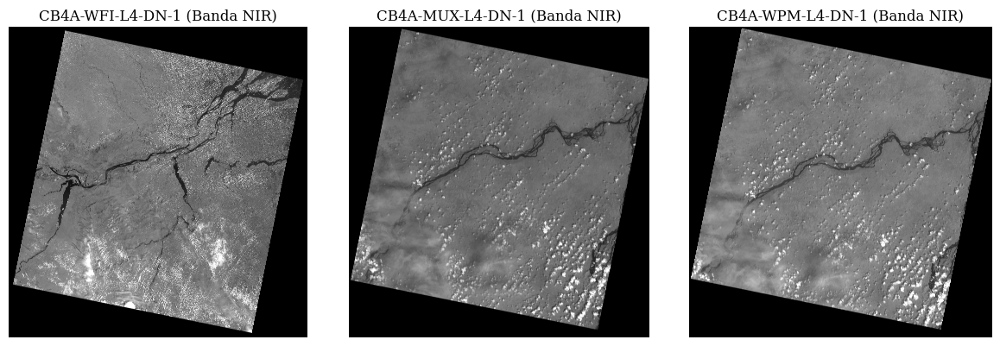

In [11]:
def normalizacao(array):
    """Normalizes numpy arrays into scale 0.0 - 1.0"""
    array_min, array_max = array.min(), array.max()
    return ((array - array_min)/(array_max - array_min))

with rasterio.open(assets_por_colecao_bordas['CB4A-WFI-L4-DN-1']['BAND16']) as banda:
    nir_band_wfi = normalizacao(banda.read(1))
with rasterio.open(assets_por_colecao_bordas['CB4A-MUX-L4-DN-1']['BAND8']) as banda:
    nir_band_mux = normalizacao(banda.read(1))
with rasterio.open(assets_por_colecao_bordas['CB4A-WPM-L4-DN-1']['BAND4']) as banda:
    nir_band_wpm = normalizacao(banda.read(1))

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
ax1.set_title(f"CB4A-WFI-L4-DN-1 (Banda NIR)")
ax1.imshow(nir_band_wfi, cmap='gray')
ax1.axis('off')
ax2.set_title(f"CB4A-MUX-L4-DN-1 (Banda NIR)")
ax2.imshow(nir_band_mux, cmap='gray')
ax2.axis('off')
ax3.set_title(f"CB4A-WPM-L4-DN-1 (Banda NIR)")
ax3.imshow(nir_band_wpm, cmap='gray')
ax3.axis('off')
plt.tight_layout()
plt.savefig(f"nir_band_wfi_mux_wpm_.png", dpi=300)
plt.show()

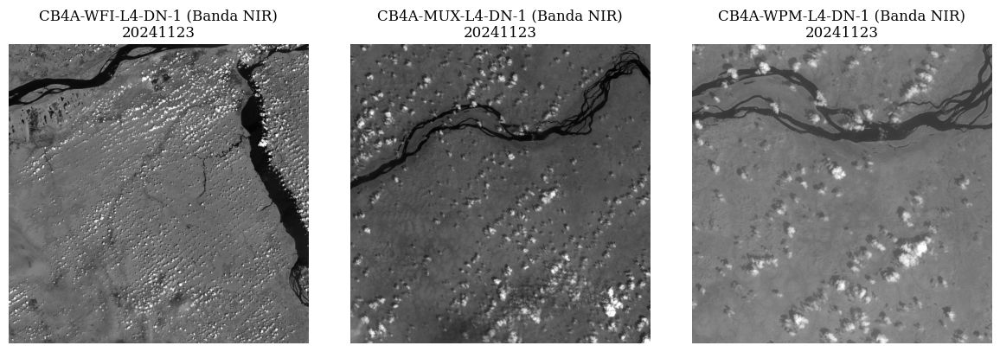

In [107]:
import rasterio
from rasterio.windows import Window
import matplotlib.pyplot as plt
import numpy as np

def normalizacao(array):
    """Normalizes numpy arrays into scale 0.0 - 1.0"""
    array_min, array_max = array.min(), array.max()
    return (array - array_min) / (array_max - array_min)

def ler_window_central(path, banda_index, tamanho=3000):
    with rasterio.open(path) as src:
        altura, largura = src.height, src.width
        x_off = (largura - tamanho) // 2
        y_off = (altura - tamanho) // 2
        window = Window(x_off, y_off, tamanho, tamanho)
        array = src.read(banda_index, window=window)
        return normalizacao(array)

# Leitura das bandas NIR com janela central de 3000x3000
nir_band_wfi = ler_window_central(assets_por_colecao_bordas['CB4A-WFI-L4-DN-1']['BAND16'], 1)
nir_band_mux = ler_window_central(assets_por_colecao_bordas['CB4A-MUX-L4-DN-1']['BAND8'], 1)
nir_band_wpm = ler_window_central(assets_por_colecao_bordas['CB4A-WPM-L4-DN-1']['BAND4'], 1)

# Plot
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 4))
ax1.set_title(f"CB4A-WFI-L4-DN-1 (Banda NIR)\n{data_alvo}")
ax1.imshow(nir_band_wfi, cmap='gray')
ax1.axis('off')
ax2.set_title(f"CB4A-MUX-L4-DN-1 (Banda NIR)\n{data_alvo}")
ax2.imshow(nir_band_mux, cmap='gray')
ax2.axis('off')
ax3.set_title(f"CB4A-WPM-L4-DN-1 (Banda NIR)\n{data_alvo}")
ax3.imshow(nir_band_wpm, cmap='gray')
ax3.axis('off')

plt.tight_layout()
plt.savefig(f"{data_alvo}_nir_band_wfi_mux_wpm_window500.png", dpi=300)
plt.show()


## Definição das funções auxiliares para recorte, bbox, visualização e para salvar os patches

In [12]:
# Funções auxiliares para recorte, bbox, visualização e para salvar os patches

def normalize(array):
    """Normalizes numpy arrays into scale 0.0 - 1.0"""
    array_min, array_max = array.min(), array.max()
    return ((array - array_min)/(array_max - array_min))

def obter_bbox_wpm(href, proporcao=0.1, deslocamento_x=0.0, deslocamento_y=0.0):
    with rasterio.open(href) as src:
        minx, miny, maxx, maxy = src.bounds
        largura_total = maxx - minx
        altura_total = maxy - miny
        largura = largura_total * proporcao
        altura = altura_total * proporcao
        x0 = minx + largura_total * deslocamento_x
        y0 = miny + altura_total * deslocamento_y
        return (x0, y0, x0 + largura, y0 + altura)

def recortar_patch(href, bbox, target_shape=None):
    with rasterio.open(href) as src:
        window = src.window(*bbox)
        if window.width <= 0 or window.height <= 0:
            raise ValueError(f"Recorte fora da imagem: {href}")
        transform = src.window_transform(window)
        data = src.read(1, window=window, out_shape=target_shape, resampling=Resampling.bilinear if target_shape else Resampling.nearest)
        if data.size == 0 or np.mean(data) < 1e-5:
            raise ValueError(f"Recorte sem dados válidos: {href}")
        # return normalize(data), transform
        return data, transform


def mostrar_bbox_sobre_imagem(href, bbox):
    with rasterio.open(href) as src:
        img = src.read(1)
        extent = [src.bounds.left, src.bounds.right, src.bounds.bottom, src.bounds.top]
        plt.imshow(img, extent=extent, cmap='gray')
        x0, y0, x1, y1 = bbox
        plt.gca().add_patch(Rectangle((x0, y0), x1 - x0, y1 - y0, fill=False, edgecolor='red', linewidth=2))
        plt.title("Região de interesse (Recorte)")
        plt.show()


def salvar_patch_tif(array, transform, crs, path_saida):
    if array.ndim == 2:
        array = array[np.newaxis, :, :]
    else:
        array = np.moveaxis(array, -1, 0)
    with rasterio.open(path_saida, 'w', driver='GTiff',
                       height=array.shape[1], width=array.shape[2],
                       count=array.shape[0], dtype=array.dtype,
                       crs=crs, transform=transform) as dst:
        dst.write(array)



def gerar_patches(assets_por_colecao, bandas_rgbnir, bbox, patche_num, data_alvo, path_saida_base='output_patches_cbers4a'):
    os.makedirs(path_saida_base, exist_ok=True)
    patches_rgb = {}

    for colecao, bandas in bandas_rgbnir.items():
        hrefs = [assets_por_colecao[colecao][b] for b in bandas]
        rgbnir_bandas = []
    
        for href in hrefs:
            with rasterio.open(href) as src:
                crs = src.crs
            patch, transform = recortar_patch(href, bbox)
            rgbnir_bandas.append(patch)
    
        # ORDEM correta das bandas: [R, G, B, NIR]
        if "WFI" in colecao:
            array_rgbnir = np.dstack([rgbnir_bandas[2], rgbnir_bandas[1], rgbnir_bandas[0], rgbnir_bandas[3]])
        elif "MUX" in colecao:
            array_rgbnir = np.dstack([rgbnir_bandas[2], rgbnir_bandas[1], rgbnir_bandas[0], rgbnir_bandas[3]])
        elif "WPM" in colecao:
            array_rgbnir = np.dstack([rgbnir_bandas[2], rgbnir_bandas[1], rgbnir_bandas[0], rgbnir_bandas[3]])
        else:
            array_rgbnir = np.dstack(rgbnir_bandas)  # fallback
    
        patches_rgb[colecao] = array_rgbnir


        # Definir subdiretório, por sensor, e nome dos patches
        if "WFI" in colecao:
            subdir = "cbers4a_wfi"
            nome_arquivo = f"{data_alvo}_CB4A_WFI_L4_DN_1_55MT_p{patche_num}.tif"
        elif "MUX" in colecao:
            subdir = "cbers4a_mux"
            nome_arquivo = f"{data_alvo}_CB4A_MUX_L4_DN_1_16MT_p{patche_num}.tif"
        elif "WPM" in colecao:
            subdir = "cbers4a_wpm"
            nome_arquivo = f"{data_alvo}_CB4A_WPM_L4_DN_1_8MT_p{patche_num}.tif"
        else:
            subdir = "outros"
            nome_arquivo = f"{colecao.replace('-', '_')}_patch.tif"

        path_subdir = os.path.join(path_saida_base, subdir)
        if not os.path.exists(path_subdir):
            os.makedirs(path_subdir)

        path_final = os.path.join(path_subdir, nome_arquivo)

        salvar_patch_tif(array_rgbnir, transform, crs, path_final)

    return patches_rgb



def mostrar_patches_rgb(patches_rgb, data_alvo):
    fig, axes = plt.subplots(1, len(patches_rgb), figsize=(18, 6), dpi=300)
    for ax, (colecao, img) in zip(axes, patches_rgb.items()):
        # Seleciona apenas as 3 primeiras bandas para exibição
        ax.imshow(img[:, :, :3])
        ax.set_title(f"{colecao}\n{data_alvo}", fontsize=12)
        ax.axis('off')
    plt.tight_layout()
    plt.show()


print(f"Funções definidas com sucesso.")

Funções definidas com sucesso.


Gerando patch 10 → x=0.650, y=0.670 para a cena do dia 20241123:


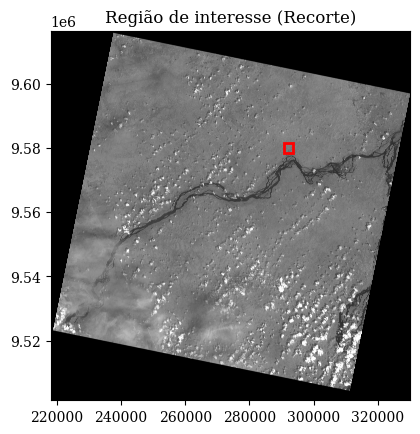

Gerando patch 11 → x=0.635, y=0.640 para a cena do dia 20241123:


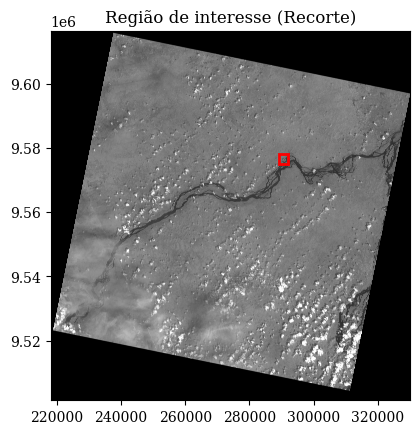

Gerando patch 12 → x=0.620, y=0.610 para a cena do dia 20241123:


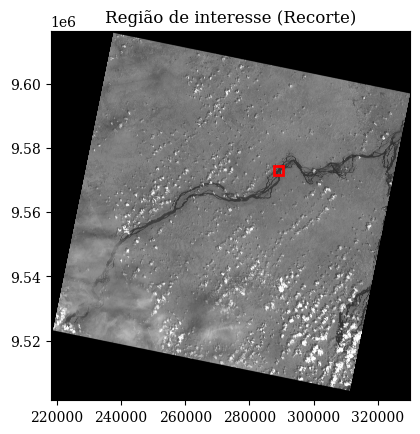

Gerando patch 13 → x=0.605, y=0.580 para a cena do dia 20241123:


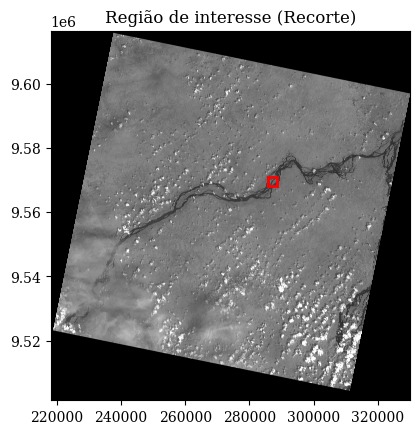

Gerando patch 14 → x=0.590, y=0.550 para a cena do dia 20241123:


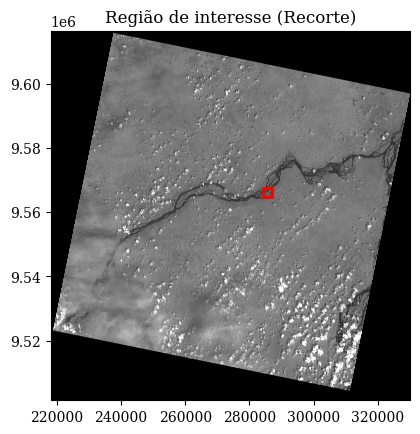

Gerando patch 15 → x=0.575, y=0.520 para a cena do dia 20241123:


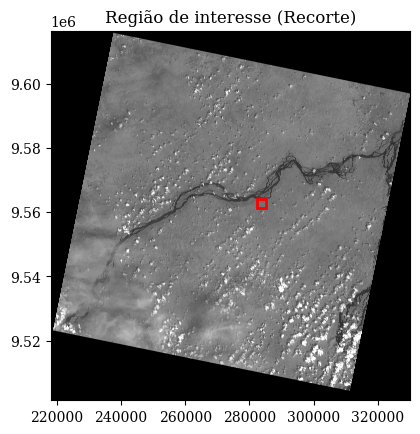

Gerando patch 16 → x=0.560, y=0.490 para a cena do dia 20241123:


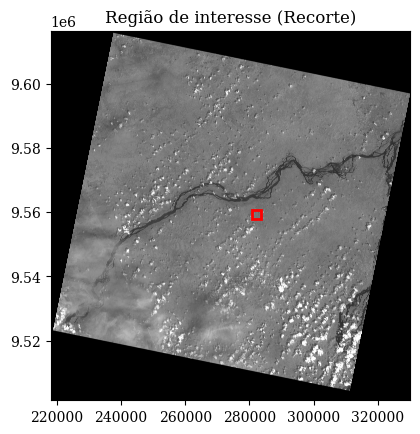

Gerando patch 17 → x=0.545, y=0.460 para a cena do dia 20241123:


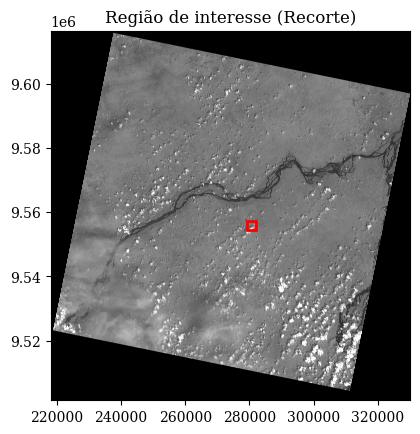

Gerando patch 18 → x=0.530, y=0.430 para a cena do dia 20241123:


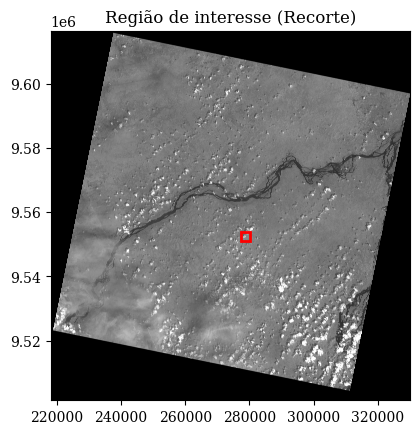

Gerando patch 19 → x=0.515, y=0.400 para a cena do dia 20241123:


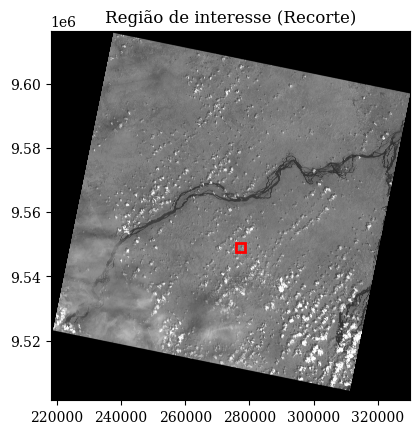

 Patches criados com sucesso!


In [13]:
start_patch = 10
end_patch = 20

for patche_num in range(start_patch, end_patch):
    i = patche_num - start_patch  # índice local para reiniciar deslocamento por grupo

    deslocamento_x = 0.65 - i * 0.015
    deslocamento_y = 0.67 - i * 0.03

    bbox = obter_bbox_wpm(
        href=assets_por_colecao_bordas['CB4A-WPM-L4-DN-1']['BAND4'],
        proporcao=0.025,
        deslocamento_x=deslocamento_x,
        deslocamento_y=deslocamento_y
    )

    print(f"Gerando patch {patche_num} → x={deslocamento_x:.3f}, y={deslocamento_y:.3f} para a cena do dia {data_alvo}:")
    mostrar_bbox_sobre_imagem(assets_por_colecao_bordas['CB4A-WPM-L4-DN-1']['BAND4'], bbox)

    patches_rgb = gerar_patches(assets_por_colecao_bordas, bandas_rgbnir, bbox, patche_num, data_alvo)

print(" Patches criados com sucesso!")



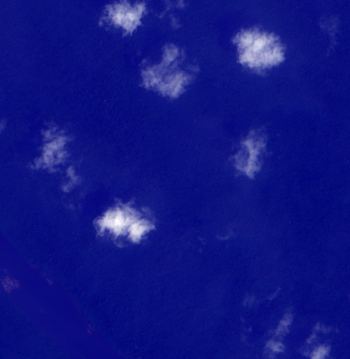
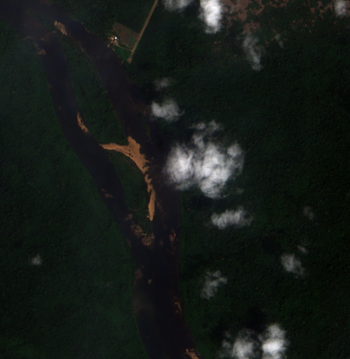
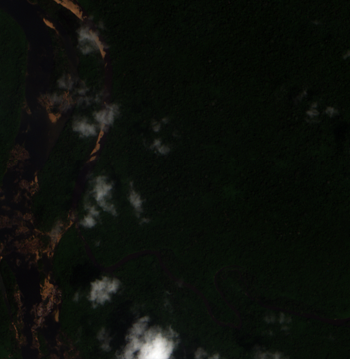
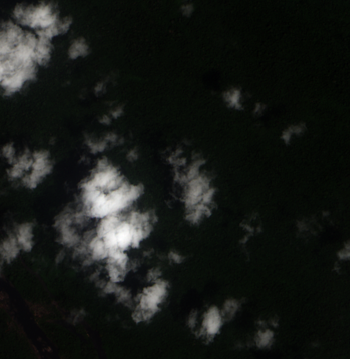
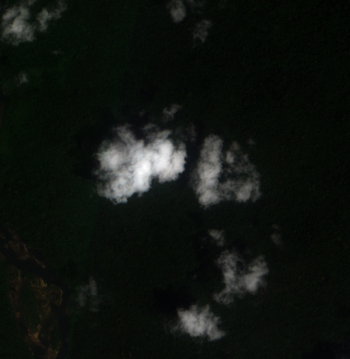
...
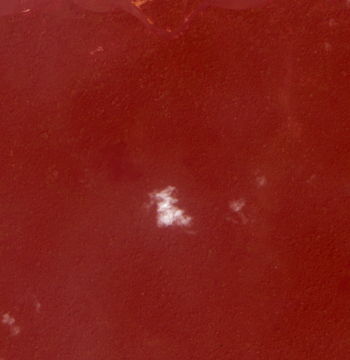
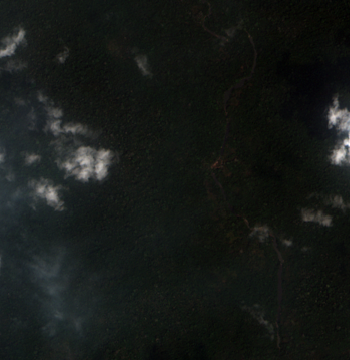
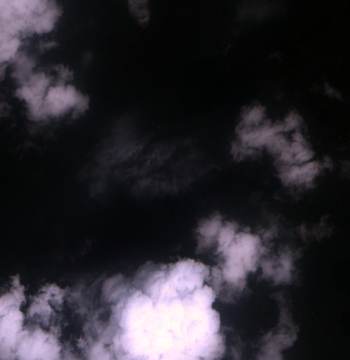
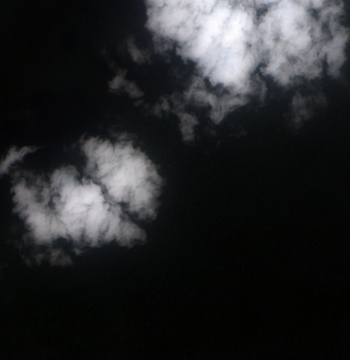
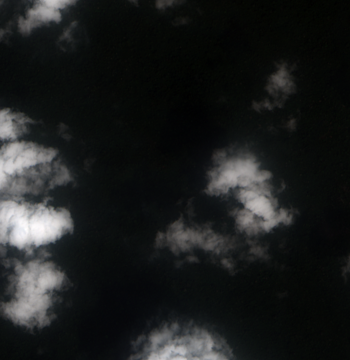

In [39]:
# Função de normalização no padrão solicitado
def normalize(array):
    """Normalizes numpy arrays into scale 0.0 - 1.0"""
    array_min, array_max = array.min(), array.max()
    return ((array - array_min)/(array_max - array_min))

# Data que temos interesse em visualizar os patches no mapa
data_alvo = "20241123"

# Usar patch central para localização inicial do mapa
primeiro_patch = f"output_patches_cbers4a/cbers4a_wpm/{data_alvo}_CB4A_WPM_L4_DN_1_8MT_p1.tif"
with rasterio.open(primeiro_patch) as src:
    bounds = transform_bounds(src.crs, 'EPSG:4326', *src.bounds)
    center = [(bounds[1] + bounds[3]) / 2, (bounds[0] + bounds[2]) / 2]

# Criar o mapa
mapa_e_patches = folium.Map(location=center, zoom_start=13, width='100%', height='700px')

# Iterar pelos patches
for num in range(1, 20):
    tif_path = f"output_patches_cbers4a/cbers4a_wpm/{data_alvo}_CB4A_WPM_L4_DN_1_8MT_p{num}.tif"

    if not os.path.exists(tif_path):
        print(f"Arquivo não encontrado: {tif_path}")
        continue

    with rasterio.open(tif_path) as src:
        bounds = transform_bounds(src.crs, 'EPSG:4326', *src.bounds)
        red   = src.read(1).astype(np.float32)
        green = src.read(2).astype(np.float32)
        blue  = src.read(3).astype(np.float32)

    # Normalize para escala 0.0 – 1.0
    rgb = np.dstack([
        normalize(red),
        normalize(green),
        normalize(blue)
    ])
    rgb_uint8 = (np.clip(rgb, 0, 1) * 255).astype(np.uint8)

    img = Image.fromarray(rgb_uint8)
    img_path = f"overlay_patch_{num}.png"
    img.save(img_path)

    bbox = [[bounds[1], bounds[0]], [bounds[3], bounds[2]]]

    folium.raster_layers.ImageOverlay(
        name=f"Patch {num}",
        image=img_path,
        bounds=bbox,
        opacity=0.7,
        interactive=True,
        cross_origin=False
    ).add_to(mapa_e_patches)

#Controle de camadas
folium.LayerControl().add_to(mapa_e_patches)

# Exibir o mapa
mapa_e_patches


# Análise exploratória das imagens multirresolução e comparações

Com o dataset multirresolução preparado, iniciamos agora a etapa de visualização e análise exploratória. O objetivo é observar graficamente as semelhanças e diferenças entre as cenas geradas por sensores com diferentes resoluções espaciais. Para isso, adotamos o seguinte critério: selecionamos um conjunto de cenas comosto por 02 diferentes tipos de cobertura — um com predominância de vegetação/floresta e outro que combina floresta com um rio — observados pelos três sensores do saté lite CBERS-4A (WFI, MUX e WPM) na mesma área no dia 23 de novembro de 2024.

<div style="text-align: justify;  margin-left: 15%; margin-right: 15%; border-style: solid; border-color: #0077b9; border-width: 1px; padding: 5px;">
    <b>As análises incluem:</b> <br>

<p>
a) A visualização da imagem original em composição RGB;<br>
b) O cálculo e exibição do NDVI, que realça a vegetação;<br>
c)A geração dos histogramas das bandas espectrais para cada sensor;<br>
d) Classificação simples usando os índices NDWI e NDVI para identificar água e vegetação.</p>

<p>Assim, nosso objetivo é ilustrar de maneira visual e comparativa, como a resolução espacial influencia a interpretação e o detalhamento das informações nas imagens do satélite CBERS-4A.</p>
</div>

## Escolha do conjunto de cenas que serão analisadas

In [99]:
#Neste bloco de código, estamos apenas definindo as cenas que serão analisados

def normalize(array):
    return ((array - array.min()) / (array.max() - array.min()))

# Cena com predominância de vegetação/floresta
arquivos = [
    f"output_patches_cbers4a/cbers4a_wfi/{data_alvo}_CB4A_WFI_L4_DN_1_55MT_p5.tif",
    f"output_patches_cbers4a/cbers4a_mux/{data_alvo}_CB4A_MUX_L4_DN_1_16MT_p5.tif",
    f"output_patches_cbers4a/cbers4a_wpm/{data_alvo}_CB4A_WPM_L4_DN_1_8MT_p5.tif"
]


# Cena com floresta e rio
arquivos2 = [
    f"output_patches_cbers4a/cbers4a_wfi/{data_alvo}_CB4A_WFI_L4_DN_1_55MT_p13.tif",
    f"output_patches_cbers4a/cbers4a_mux/{data_alvo}_CB4A_MUX_L4_DN_1_16MT_p13.tif",
    f"output_patches_cbers4a/cbers4a_wpm/{data_alvo}_CB4A_WPM_L4_DN_1_8MT_p13.tif"
]


nomes = ["CB4A WFI (55m)", "CB4A MUX (16m)", "CB4A WPM (8m)"]

## Visualização da imagem original em composição RGB, cálculo e exibição do NDVI, que realça a vegetação

O índice de vegetação por diferença normalizada (NDVI) é calculado usando as bandas espectrais do vermelho e do infravermelho próximo (NIR). Ele avalia se o alvo observado contém ou não vegetação verde viva.

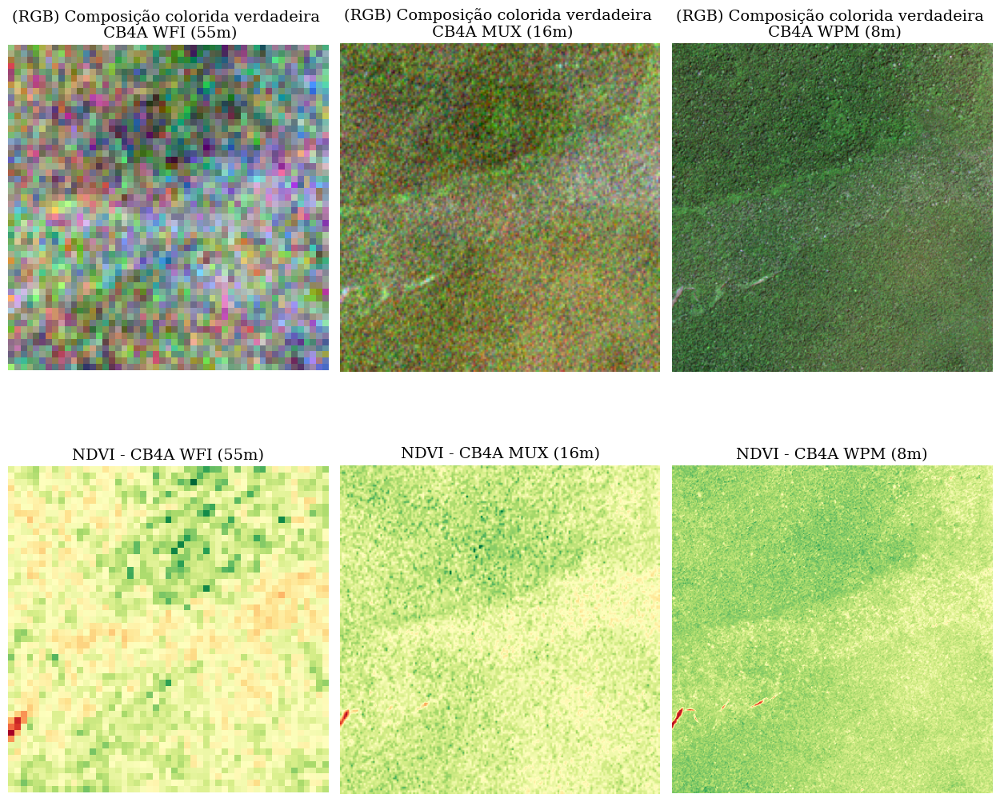

In [112]:


fig, axes = plt.subplots(2, 3, figsize=(14, 12))
# plt.subplots_adjust(hspace=0.1)

for i, (arquivo, nome) in enumerate(zip(arquivos, nomes)):
    ds = gdal.Open(arquivo, gdal.GA_ReadOnly)

    # Bandas
    red = normalize(ds.GetRasterBand(1).ReadAsArray())
    green = normalize(ds.GetRasterBand(2).ReadAsArray())
    blue = normalize(ds.GetRasterBand(3).ReadAsArray())
    nir = normalize(ds.GetRasterBand(4).ReadAsArray())

    # Composição RGB verdadeira
    rgb = np.dstack((red, green, blue))
    axes[0, i].imshow(rgb)
    axes[0, i].set_title(f"(RGB) Composição colorida verdadeira \n {nome}", fontsize=14)
    axes[0, i].axis('off')

    # NDVI
    ndvi = (nir - red) / (nir + red + 0.0000000001)
    ndvi = np.clip(ndvi, -1, 1)
    im = axes[1, i].imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
    axes[1, i].set_title(f"NDVI - {nome}", fontsize=14)
    axes[1, i].axis('off')

# Título e layout
#plt.suptitle("Visualização RGB e NDVI por Sensor CBERS-4A", fontsize=14)
plt.savefig("rgb_ndvi_vegetaca.png", dpi=300)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


## Histogramas das bandas espectrais para cada sensor
O histograma de uma imagem digital, também conhecido como distribuição de frequência, é a representação gráfica em colunas que mostra a intensidade dos valores e o número de pixels com tal intensidade, sendo a base para diversos tipos de processamento de imagens digitais (Gonzalez & Woods, 2007).

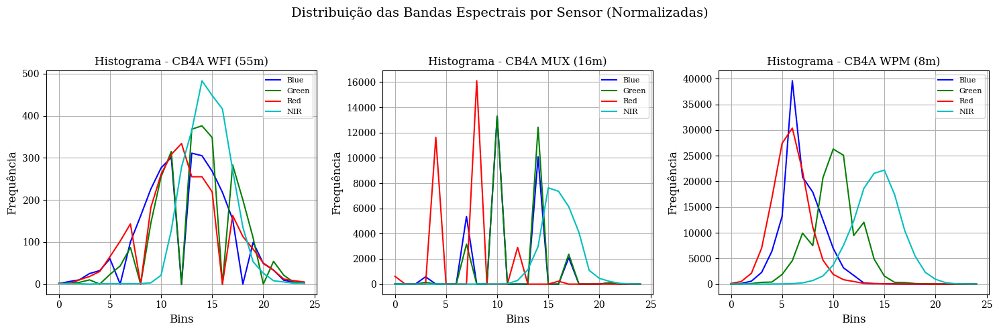

In [82]:
# Preparar figura com 3 subplots (um por sensor)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
plt.subplots_adjust(wspace=0.3)

for i, (arquivo, nome) in enumerate(zip(arquivos, nomes)):
    ds = gdal.Open(arquivo, gdal.GA_ReadOnly)
    
    # Lê e normaliza as 4 bandas
    bandas = [normalize(ds.GetRasterBand(b).ReadAsArray()) for b in range(1, 5)]

    # Cores e rótulos para cada banda
    cores = ['b', 'g', 'r', 'c']
    labels = ['Blue', 'Green', 'Red', 'NIR']

    for banda, cor, label in zip(bandas, cores, labels):
        hist, _ = np.histogram(banda, bins=25, range=(0, 1))
        axes[i].plot(hist, color=cor, label=label)

    axes[i].set_title(f"Histograma - {nome}", fontsize=12)
    axes[i].grid(True)
    axes[i].set_xlabel("Bins", fontsize=12)
    axes[i].set_ylabel("Frequência", fontsize=12)
    axes[i].legend(fontsize=8)

plt.suptitle("Distribuição das Bandas Espectrais por Sensor (Normalizadas)", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()


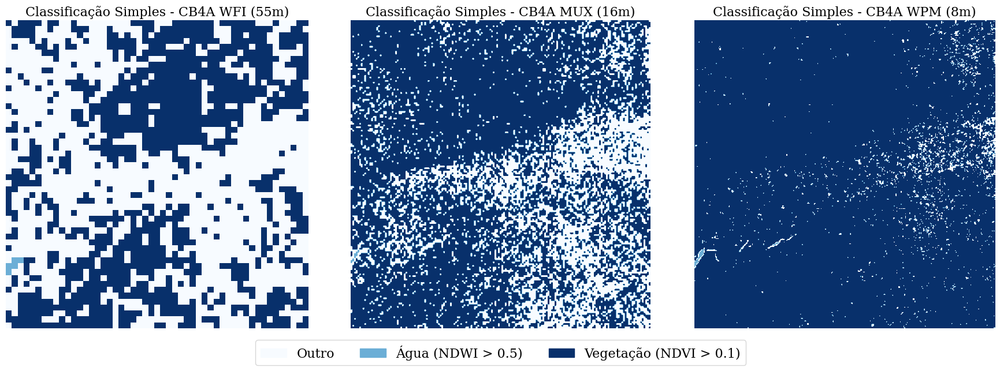

In [123]:
# Definição de constantes empíricas
delta = 1e-10
limiar_ndwi = 0.5
limiar_ndvi = 0.1

# Criar figura
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Colormap com 3 classes
colormap_3classes = plt.get_cmap('Blues', 3)

for i, (arquivo, nome) in enumerate(zip(arquivos, nomes)):
    ds = gdal.Open(arquivo, gdal.GA_ReadOnly)

    # Leitura das bandas
    red = normalize(ds.GetRasterBand(1).ReadAsArray())
    green = normalize(ds.GetRasterBand(2).ReadAsArray())
    nir = normalize(ds.GetRasterBand(4).ReadAsArray())

    # Conversão da banda NIR para float
    nir_n = nir.astype(float)

    # Cálculo dos índices
    ndwi = (green - nir_n) / (green + nir_n + delta)
    ndvi = (nir_n - red) / (nir_n + red + delta)

    # Classificação: 0 - Outro, 1 - Água, 2 - Vegetação
    # criação de classificações simples
    classificacao = np.zeros_like(ndwi)
    classificacao = np.where(ndwi > limiar_ndwi, 1, np.where(ndvi > limiar_ndvi, 2, 0))

    # Visualização
    axes[i].imshow(classificacao, cmap=colormap_3classes, vmin=0, vmax=2)
    axes[i].set_title(f"Classificação Simples - {nome}", fontsize=16)
    axes[i].axis('off')

# Legenda
legenda = [
    Patch(color=colormap_3classes(0), label='Outro'),
    Patch(color=colormap_3classes(1), label='Água (NDWI > 0.5)'),
    Patch(color=colormap_3classes(2), label='Vegetação (NDVI > 0.1)')
]

#legenda centralizada abaixo da figura
fig.legend(handles=legenda, loc='lower center', bbox_to_anchor=(0.5, -0.05), ncol=3, fontsize=16)

plt.tight_layout(rect=[0, 0.05, 1, 1])  # Ajuste de margem inferior para acomodar a legenda
plt.show()


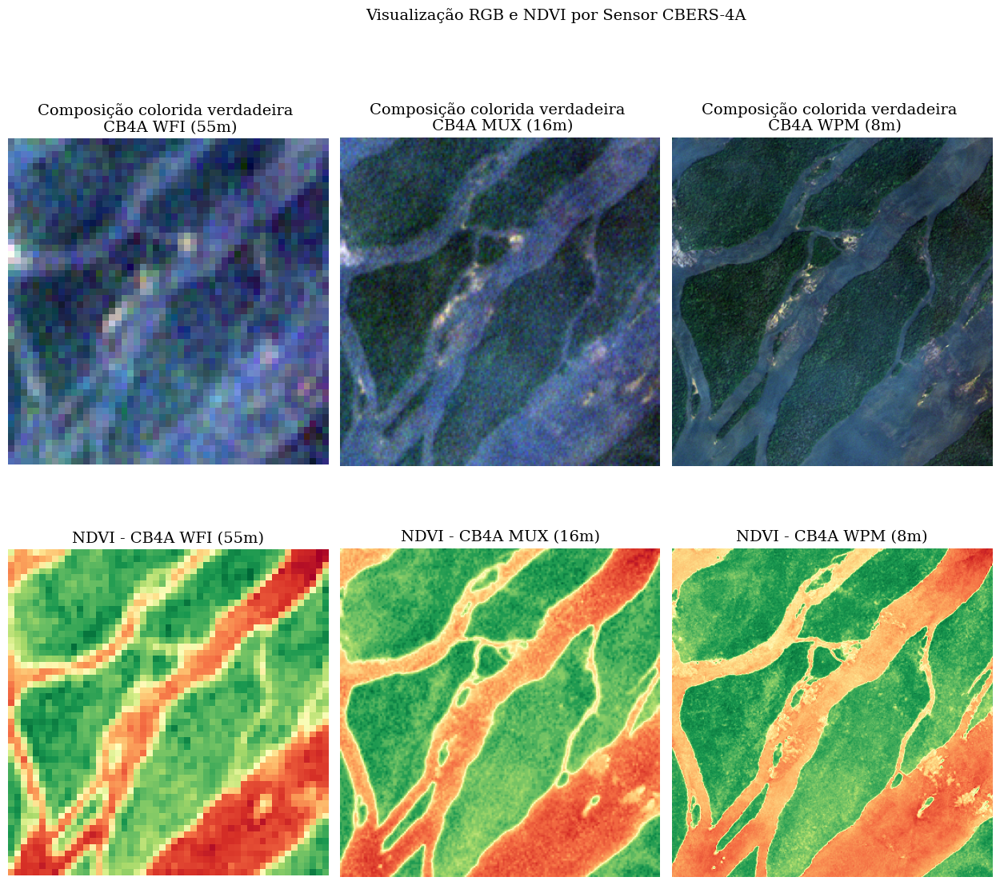

In [51]:


fig, axes = plt.subplots(2, 3, figsize=(14, 12))
plt.subplots_adjust(hspace=0.25)

for i, (arquivo, nome) in enumerate(zip(arquivos2, nomes)):
    ds = gdal.Open(arquivo, gdal.GA_ReadOnly)

    # Bandas
    red = normalize(ds.GetRasterBand(1).ReadAsArray())
    green = normalize(ds.GetRasterBand(2).ReadAsArray())
    blue = normalize(ds.GetRasterBand(3).ReadAsArray())
    nir = normalize(ds.GetRasterBand(4).ReadAsArray())

    # Composição RGB verdadeira
    rgb = np.dstack((red, green, blue))
    axes[0, i].imshow(rgb)
    axes[0, i].set_title(f"Composição colorida verdadeira \n {nome}", fontsize=14)
    axes[0, i].axis('off')

    # NDVI
    ndvi = (nir - red) / (nir + red + 0.0000000001)
    ndvi = np.clip(ndvi, -1, 1)
    im = axes[1, i].imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
    axes[1, i].set_title(f"NDVI - {nome}", fontsize=14)
    axes[1, i].axis('off')

# Título e layout
plt.suptitle("Visualização RGB e NDVI por Sensor CBERS-4A", fontsize=14)
plt.tight_layout(rect=[0, 0, 0.9, 0.95])
plt.show()


## Histogramas das Bandas (patch da região de interesse contendo floresta e rio)
A seguir, visualizamos os histogramas das bandas espectrais (Blue, Green, Red e NIR) para a mesma cena — um patch da região da região de interesse contendo floresta e rio — capturada pelos três sensores do CBERS-4A, mas com diferentes resoluções espaciais.

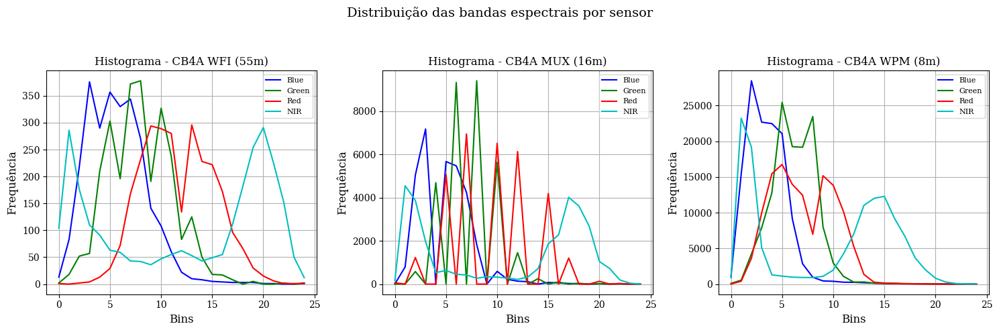

In [97]:
# Vamos usar uma figura com 3 subplots (um por sensor)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
plt.subplots_adjust(wspace=0.3)

for i, (arquivo, nome) in enumerate(zip(arquivos2, nomes)):
    ds = gdal.Open(arquivo, gdal.GA_ReadOnly)
    
    # Lê e normaliza as 4 bandas
    bandas = [normalize(ds.GetRasterBand(b).ReadAsArray()) for b in range(1, 5)]

    # Cores e rótulos para cada banda
    cores = ['b', 'g', 'r', 'c']
    labels = ['Blue', 'Green', 'Red', 'NIR']

    for banda, cor, label in zip(bandas, cores, labels):
        hist, _ = np.histogram(banda, bins=25, range=(0, 1))
        axes[i].plot(hist, color=cor, label=label)

    axes[i].set_title(f"Histograma - {nome}", fontsize=12)
    axes[i].grid(True)
    axes[i].set_xlabel("Bins", fontsize=12)
    axes[i].set_ylabel("Frequência", fontsize=12)
    axes[i].legend(fontsize=8)

plt.suptitle("Distribuição das bandas espectrais por sensor", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.93])
plt.show()


Nos gráficos acima, é possível observar que sensores com maior resolução espacial, como é o caso do WPM (8m), apresentam distribuições mais detalhadas, refletindo a maior quantidade de pixels e variação espectral. Já o sensor WFI, com resolução mais baixa (55m), mostra histogramas mais suavizados. A banda NIR, usada para identificar vegetação, se destaca com uma distribuição distinta, especialmente nos sensores de maior resolução. Isso reforça como a resolução tem influência na riqueza na qualidade das análises.


## Exemplo de classificação por NDWI e NDVI aplicados a uma mesma área

A seguir, com base em exemplos discutidos duarante a aula, apresentaremos uma comparação entre os resultados de classificação por NDWI e NDVI aplicados à mesma área — contendo floresta e um rio — observada pelos três sensores.


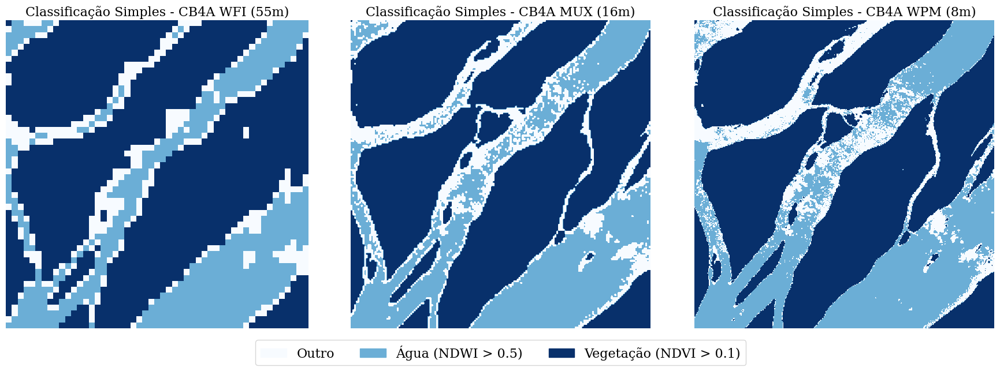

In [124]:
# Definição de constantes empíricas
delta = 1e-10
limiar_ndwi = 0.5
limiar_ndvi = 0.1

# Criar figura
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Colormap com 3 classes
colormap_3classes = plt.get_cmap('Blues', 3)

for i, (arquivo, nome) in enumerate(zip(arquivos2, nomes)):
    ds = gdal.Open(arquivo, gdal.GA_ReadOnly)

    # Leitura das bandas
    red = normalize(ds.GetRasterBand(1).ReadAsArray())
    green = normalize(ds.GetRasterBand(2).ReadAsArray())
    nir = normalize(ds.GetRasterBand(4).ReadAsArray())

    # Conversão da banda NIR para float
    nir_n = nir.astype(float)

    # Cálculo dos índices
    ndwi = (green - nir_n) / (green + nir_n + delta)
    ndvi = (nir_n - red) / (nir_n + red + delta)

    # Classificação: 0 - Outro, 1 - Água, 2 - Vegetação
    # criação de classificações simples
    classificacao = np.zeros_like(ndwi)
    classificacao = np.where(ndwi > limiar_ndwi, 1, np.where(ndvi > limiar_ndvi, 2, 0))

    # Visualização
    axes[i].imshow(classificacao, cmap=colormap_3classes, vmin=0, vmax=2)
    axes[i].set_title(f"Classificação Simples - {nome}", fontsize=16)
    axes[i].axis('off')

# Legenda
legenda = [
    Patch(color=colormap_3classes(0), label='Outro'),
    Patch(color=colormap_3classes(1), label='Água (NDWI > 0.5)'),
    Patch(color=colormap_3classes(2), label='Vegetação (NDVI > 0.1)')
]

#legenda centralizada abaixo da figura
fig.legend(handles=legenda, loc='lower center', bbox_to_anchor=(0.5, -0.05), ncol=3, fontsize=16)

plt.tight_layout(rect=[0, 0.05, 1, 1])  # Ajuste de margem inferior para acomodar a legenda
plt.show()


## Comparação entre sensores (Área observada contendo floresta e rio)
As imagens acima mostram uma comparação entre três sensores do satélite CBERS-4A (WFI, MUX e WPM), que captaram a mesma região contendo áreas de vegetação e um rio. Cada sensor possui uma resolução espacial diferente — ou seja, o "nível de detalhe" das imagens varia. Mesmo aplicando o mesmo método de classificação (usando os índices NDWI para identificar água e NDVI para vegetação), os resultados mudam bastante dependendo da resolução. O sensor WFI (55m), por ter pixels maiores, representa os rios e a vegetação de forma mais generalizada, com menos detalhes. Já o WPM (8m), que tem maior resolução, consegue mostrar curvas do rio, bordas e fragmentos de vegetação com muito mais precisão. Essa visualização ajuda a perceber, de forma prática, como a resolução influencia diretamente na qualidade da informação extraída. É um passo importante para quem está começando na área entender que não basta ter uma boa técnica de análise — o tipo de sensor e sua resolução também fazem toda a diferença.

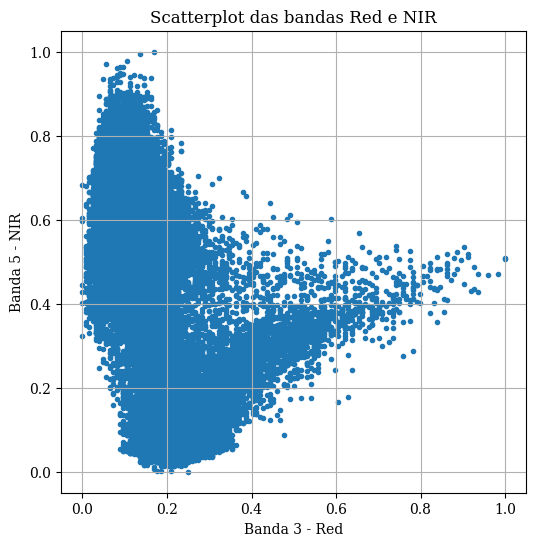

In [54]:
# obter os vetores de 1 dimensão de cada banda
vetor_red = red.flatten()
vetor_nir = nir.flatten()

# construir o gráfico com o scatterplot
plt.figure(figsize=(6, 6))

plt.scatter(vetor_red, vetor_nir, marker='.')
plt.xlabel("Banda 3 - Red")
plt.ylabel("Banda 5 - NIR")
plt.title("Scatterplot das bandas Red e NIR")
plt.grid();

# Análises adicionais (Opcional): Ver sobre Skewness and Kurtosis

# Principais referências bibliográficas consultadas

- [Spatio Temporal Asset Catalog Specification](https://stacspec.org/)


- [Python Client Library for STAC Service](https://pystac-client.readthedocs.io/en/latest/)